# Individual Project - Revised Version
**- Yan Cao**

# Gun violence - a unique problem in the US

## Introduction

Firearm is always a hot topic in the world, its outstanding performances and high power level makes it massively used not only in the army but also in crimes. And when talking about those mass shooting tragedies out there in the world, the discussion would then always lead to the US gun violence and its lack of gun control.

In this data product, I applied different class concepts learned and redesigned three different aspects of the original data product (link: https://www.vox.com/policy-and-politics/2017/10/2/16399418/us-gun-violence-statistics-maps-charts), and then made deceptive versions to make the visualization of the results more persuasive to the audiences.

In [1]:
# print all the outputs in a cell:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# load all the useful packages:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
%pylab inline
from io import StringIO
import matplotlib.cm as cm
import matplotlib as mpl
color = sns.color_palette()
import plotly.plotly as py
import plotly.graph_objs as go
from plotly import tools
from plotly.offline import iplot, init_notebook_mode
init_notebook_mode()
from itertools import cycle, islice
%matplotlib inline
pd.options.mode.chained_assignment = None
pd.options.display.max_columns = 999

Populating the interactive namespace from numpy and matplotlib


## I. Analysis on Firearms Ownerships and Firearms Related Deaths
** Brief Intro:** In this part I want to analyze the firearms ownerships among different developed countries and how the firearms related deaths (including both homicides and suicides) look for each country. And by comparing the results of each country I would then reach a conclusion of whether US has the most severe issues in the area of study.

### Goal, Questions, Metrics
**Goal:** The goal of this part is to reach a conclusion showing US has the most issue with gun violence among developed countries, based on its massive amount of firearms ownerships.  
**Questions:** The questions are:  
1) Does US has the most firearm ownership per capita comparing to the other developed countries?  
2) Does US has the most firearm related deaths comparing to the other developed countries?  
3) Based on the results, does US have the most severe issue with gun violence?  
**Metrics:** In order to answer the questions and then reach the goal, I would develop three different plots on firearms ownerships, firearms related homicide rates, and firearms related suicide rates among developed countries. And then I would make a combined plot to show the comparison of the previous three plots and then reach the conclusion.

### The Making of & Data Wrangling:
**- In this part I used two different datasets:**  
- The first dataset contains information on worldwide firearms ownerships and firearms caused homicide statistics, which I downloaded from the same data source that the original data product used (link: https://docs.google.com/spreadsheets/d/1chqUZHuY6cXYrRYkuE0uwXisGaYvr7durZHJhpLGycs/edit#gid=0). As a data cleaning process, because I only want to analyze the firearms ownership rates and the rate of homicides by firearms among different countries, I then dropped unwanted columns first. Also because there are too many countries in the world under different development stages, it is hard to do comprehensive analysis on all the countries. Here I picked only the developed countries instead because they have "similar background" and will make the analysis more reasonable. I found the list of developed countries from wikipedia (link:https://en.wikipedia.org/wiki/The_World_Factbook_list_of_developed_countries).  
- The second dataset contains information on developed countries' per 100,000 population per year data on firearm-related death rates, firearm-related homicides rates and percentage, and firearm-related suicides rates and percentage. All the data are retrieved manually from wikipedia (link: https://en.wikipedia.org/wiki/List_of_countries_by_firearm-related_death_rate#Sources). There's no unwanted information in this dataset.  
- I then combined/merged two datasets together.

**- Data Wrangling:**

In [2]:
# load dataframes:
world = pd.read_csv('https://raw.githubusercontent.com/allisonyanc/IP_viz/IP_FV_Deceptive/World%20firearms%20murders%20and%20ownership.csv')
firearm_death = pd.read_csv('https://raw.githubusercontent.com/allisonyanc/IP_viz/IP_FV_Deceptive/Firearm-related-death-rate.csv')

In [3]:
# drop unwanted columns:
world.drop(['Source','Number of homicides by firearm',
            'Homicide by firearm rate per 100,000 pop','Average total all civilian firearms'], axis=1, inplace=True)

In [4]:
# join two dataframes by country names:
df = world.merge(firearm_death, how='left')

In [5]:
# subset the data frame into developed countries only:
# create filter list
filter = ['United States', 'Australia', 'Austria', 'Belgium',
            'Canada', 'Cyprus', 'Czech Republic', 'Denmark', 'Estonia', 'Finland', 'France',
            'Germany', 'Greece', 'Iceland', 'Ireland', 'Israel', 'Italy', 'Japan', 'Netherlands',
            'New Zealand', 'Norway', 'Portugal', 'Slovakia', 'Slovenia', 'Korea, South', 'Spain',
            'Sweden', 'Singapore', 'Switzerland', 'United Kingdom']

In [6]:
# create new dataframe with only developed countries in it:
dc = df[df['Country/Territory'].isin(filter)]

In [7]:
# sort dc by 'Rank by rate of ownership':
own = dc.sort_values(by=['Rank by rate of ownership'])

### Redesign
**- The Reasonings:**  
In this part I redesigned the following two plots in the original data product:

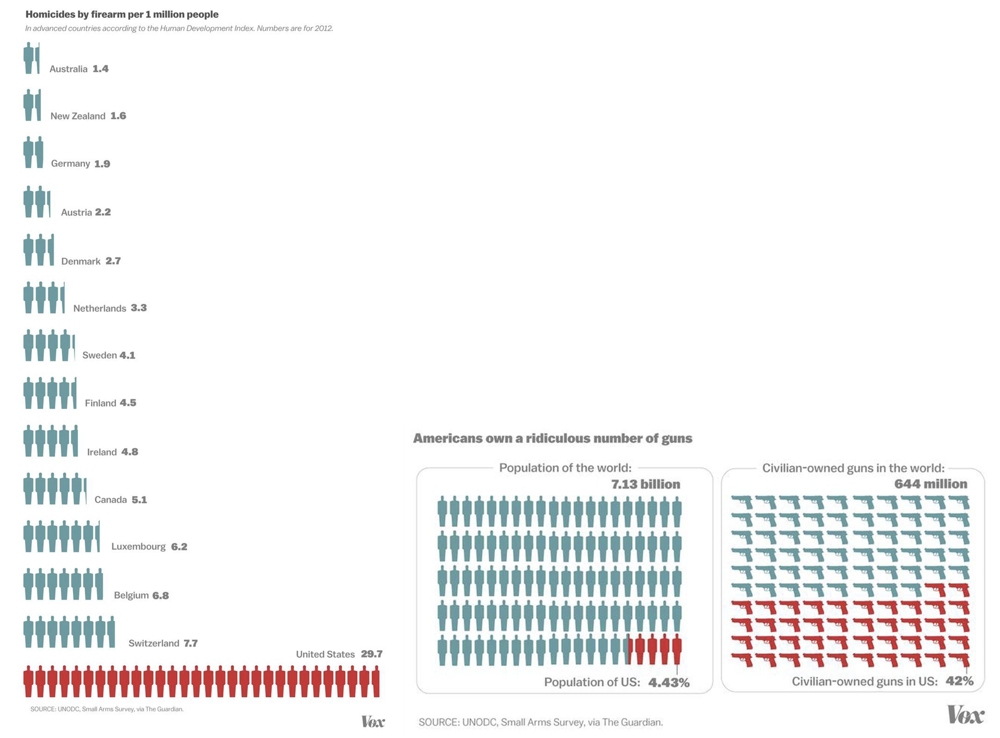

In [8]:
# "1) America has six times as many firearm homicides as Canada, and nearly 16 times as many as Germany" 
# & "2) America has 4.4 percent of the world’s population, but almost half of the civilian-owned guns around the world"
from IPython.display import Image
Image("redesign_one.png", width=800)

The reason why I want to redesign these two plots together is because:  
- The first plot didn't take country population size into consideration. It shows that US has the most homicides by firearm per 1 million people comparing to other countries, but as a fact US also has larger population size than many other countries, so this plot is considered biased or missing information.  
- The second plot shows US has huge amount in the gun owndership, but I think instead of making these two plots side by side, ploting a per capita gun owndership plot is more straightforward.  
- Also I think by placing these plots as individual results doesn't reach any comparative conclusions, so I combined different plots side-by-side into one plot for better visualization and to reach the one general conclusion through comparisons.

**- My redesign steps and interpretations:**  

**Average number of firearms per 100 people in developed countries**

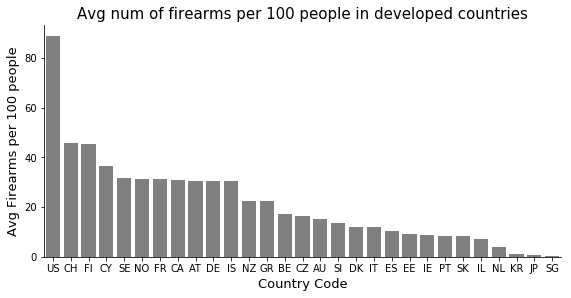

In [9]:
sns.factorplot(y='Average firearms per 100 people', data=own, x='ISO code',aspect=2, kind='bar', color='grey')
plt.title('Avg num of firearms per 100 people in developed countries', size=15)
plt.xlabel('Country Code', size=13)
plt.ylabel('Avg Firearms per 100 people', size=13)
plt.figure(figsize=(16,8))

Based on the statistics, the average number of firearms per 100 people in the US is 88.8, which is almost equal to one firearm per capita. And Switzerland as the second most in developed countries, has an average number of 45.7 firearms per 100 people, which is only half of the US number. With this horrible number of firearms ownership in mind, one would ask how does the homicide and suicide look in developed countries?

**Percentage of firearm-related homicides in developed countries**

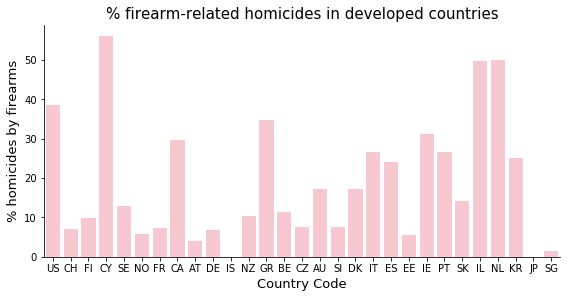

In [10]:
# Homicides:
sns.factorplot(y='pcnt_homicides', data=own, x='ISO code',aspect=2, kind='bar', color='pink')
plt.title('% firearm-related homicides in developed countries', size=15)
plt.xlabel('Country Code',size=13)
plt.ylabel('% homicides by firearms',size=13)
plt.figure(figsize=(16,8))

The homicides pattern doesn't follow ownerships pattern, which means there's no strong relationship between the per capita gun ownership and firearm-related homicides. 

**Percentage of firearm-related suicides in developed countries**

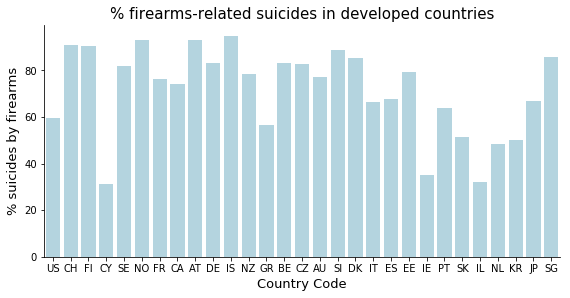

In [11]:
# Suicides:
sns.factorplot(y='pcnt_suicides', data=own, x='ISO code',aspect=2, kind='bar', color='lightblue')
plt.title('% firearms-related suicides in developed countries', size=15)
plt.xlabel('Country Code',size=13)
plt.ylabel('% suicides by firearms',size=13)
plt.figure(figsize=(16,8))

Then I tried to analyze suicides as well but still didn't find any strong relationship to gun ownership. But after analyzing the suicide rates I found out that within all the firearm-related deaths, the suicides rate is much higher than homicides rates.

### Finding 1:

<Container object of 29 artists>

<Container object of 29 artists>

<Container object of 29 artists>

([<matplotlib.axis.XTick at 0x11580c690>,
 <a list of 29 Text xticklabel objects>)

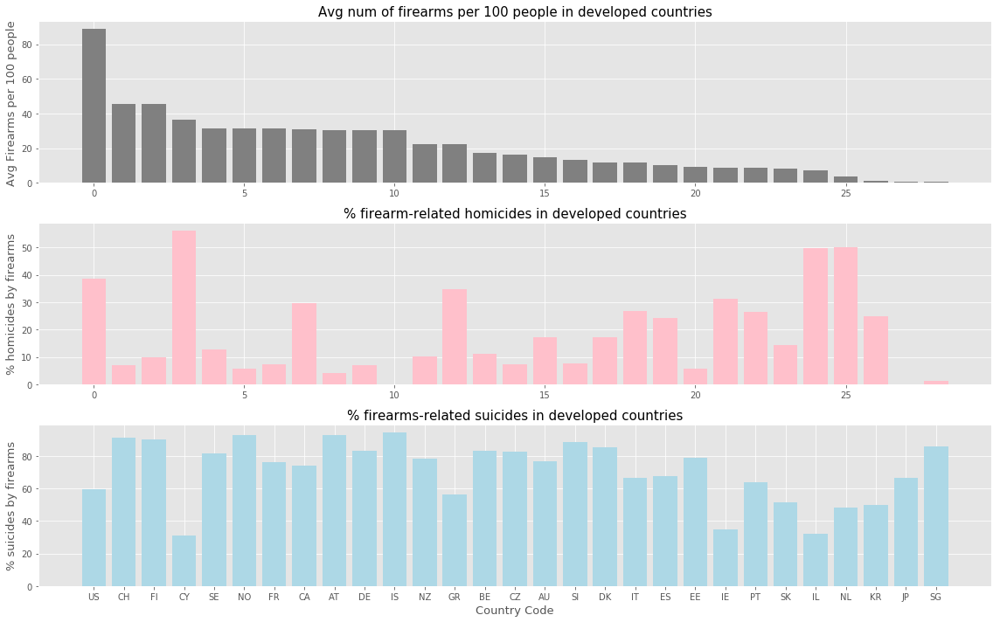

In [12]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('ggplot')
plt.rcParams['figure.figsize']=(16,10)   # system change plot size

plt.close('all')

x = own['ISO code']
y1 = own['Average firearms per 100 people']
y2 = own['pcnt_homicides']
y3 = own['pcnt_suicides']

x_pos = [i for i, _ in enumerate(x)]
ax1 = plt.subplot(3, 1, 1)
plt.bar(x_pos, y1, color='grey')
plt.title('Avg num of firearms per 100 people in developed countries', size=15)
plt.ylabel('Avg Firearms per 100 people', size=13)

ax2 = plt.subplot(3, 1, 2)
plt.bar(x_pos, y2, color='pink')
plt.title('% firearm-related homicides in developed countries', size=15)
plt.ylabel('% homicides by firearms',size=13)

ax3 = plt.subplot(3, 1, 3)
plt.bar(x_pos, y3, color='lightblue')
plt.title('% firearms-related suicides in developed countries', size=15)
plt.xlabel('Country Code',size=13)
plt.ylabel('% suicides by firearms',size=13)

plt.xticks(x_pos, x)
plt.tight_layout()     # auto fix subplots' sizes

plt.show()

As shown in the chart, one can conclude that US among all the developed countries has the largest gun ownership rate, which could be one of the major reasons leading to firearm-related deaths. But that might not be the only reason since either the firearm-related homicides or suicides charts has strong patterns following the gun ownerships trend. Many developed countries with less gun ownership rates still has large percentage of homicides/ suicides caused by firearms. But on the other hand, by comparing the homicide and suicide charts one can clearly tell that the percentage of firearm-related suicide in developed countries is much higher than homicides, which this result can be treated as a warning sign for the governments to put more force into the regulations and control strategies.

**- Argument Model:**  
**My claim**: US has the most issue with gun violence among developed countries, based on its massive firearm ownerships. **Is based on data**: gun ownership rates and firearm-related homicides and suicides in different developed countries. **Since warrant**: based on the chart it shows US has the most gun ownership rate and the rate is at least two times larger than other developed countries, and also its homicide and suicide rates are still in the higher rate country list among developed countries. **On account of backing**: Based on many existing analysis, higher levels of gun ownership are linked to higher gun-related deaths (source: https://www.weforum.org/agenda/2018/02/chart-of-day-the-link-between-gun-ownership-and-gun-deaths/). **Rebuttal**: Either homicide or suicide plot showed less relation to the gun ownership rate, which means firearm ownership rate is not the direct reason leading firearm-related death, and it is obvious that there're more suicides than homicides.  
This also match with the **audience model**'s want, need and fear.

### Deception
The deceptive version is based on my redesigned version instead of the original data product.  
  
**- The Reasonings:**  
From the redesign version one can tell the y-axis scales are all different. Even though one can still tell the firearm-related suicide rate is higher than homicide rate, it is still hard due to inconsistence y-axis scales. To have better view of the comparisons of the three plots, I reset the y axis scales of all three plots to max of 100. Also because US is our main target, it is helpful to highlight the US bar in red as well as mark it in the chart for more straightforward visualization.

(0.0, 100)

(0.0, 100)

(0.0, 100)

([<matplotlib.axis.XTick at 0x103b2a150>,
 <a list of 29 Text xticklabel objects>)

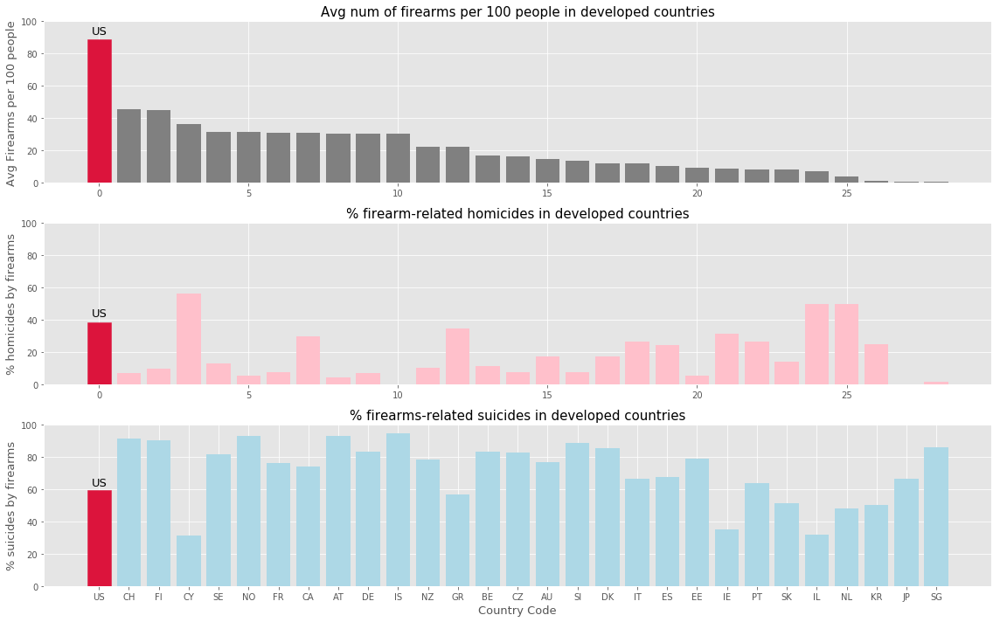

In [13]:
plt.style.use('ggplot')
plt.rcParams['figure.figsize']=(16,10)   # system change plot size

plt.close('all')

x = own['ISO code']
y1 = own['Average firearms per 100 people']
y2 = own['pcnt_homicides']
y3 = own['pcnt_suicides']

x_pos = [i for i, _ in enumerate(x)]
ax1 = plt.subplot(3, 1, 1)
barlist = plt.bar(x_pos, y1, color='grey')
plt.title('Avg num of firearms per 100 people in developed countries', size=15)
plt.ylabel('Avg Firearms per 100 people', size=13)
ax1.set_ylim(ymax=100)# to keep consistency with the next two plots, set y axis scale max=100
barlist[0].set_color('crimson')
# Adding texts:
ax1.annotate('US', xy=(0, 92), xytext=(-0.25, 92), fontsize=13,)

ax2 = plt.subplot(3, 1, 2)
barlist = plt.bar(x_pos, y2, color='pink')
plt.title('% firearm-related homicides in developed countries', size=15)
plt.ylabel('% homicides by firearms',size=13)
ax2.set_ylim(ymax=100)     # becasue it's percentage, set y axis scale max=100
barlist[0].set_color('crimson')
# Adding texts:
ax2.annotate('US', xy=(0, 42), xytext=(-0.25, 42), fontsize=13,)

ax3 = plt.subplot(3, 1, 3)
barlist = plt.bar(x_pos, y3, color='lightblue')
plt.title('% firearms-related suicides in developed countries', size=15)
plt.xlabel('Country Code',size=13)
plt.ylabel('% suicides by firearms',size=13)
ax3.set_ylim(ymax=100)     # becasue it's percentage, set y axis scale max=100
barlist[0].set_color('crimson')
# Adding texts:
ax3.annotate('US', xy=(0, 62), xytext=(-0.25, 62), fontsize=13,)

plt.xticks(x_pos, x)

plt.tight_layout()     # auto fix subplots' sizes

plt.show()

**- Data Pixel Ratio**:  
Because there are more than one comparison in the chart, so using colors is better than black and white. Also using red highlight in the chart will draw more attention to the target country. Eye beats memory: since the three plots are having same x-axis and y-axis scales and are placed side-by-side, it's easy for the audience to read and catch information. Also all the pixels used in this chart are useful and has its own meaning when interpreting the results.

### Original version vs. Redesigned version vs. Deceptive version

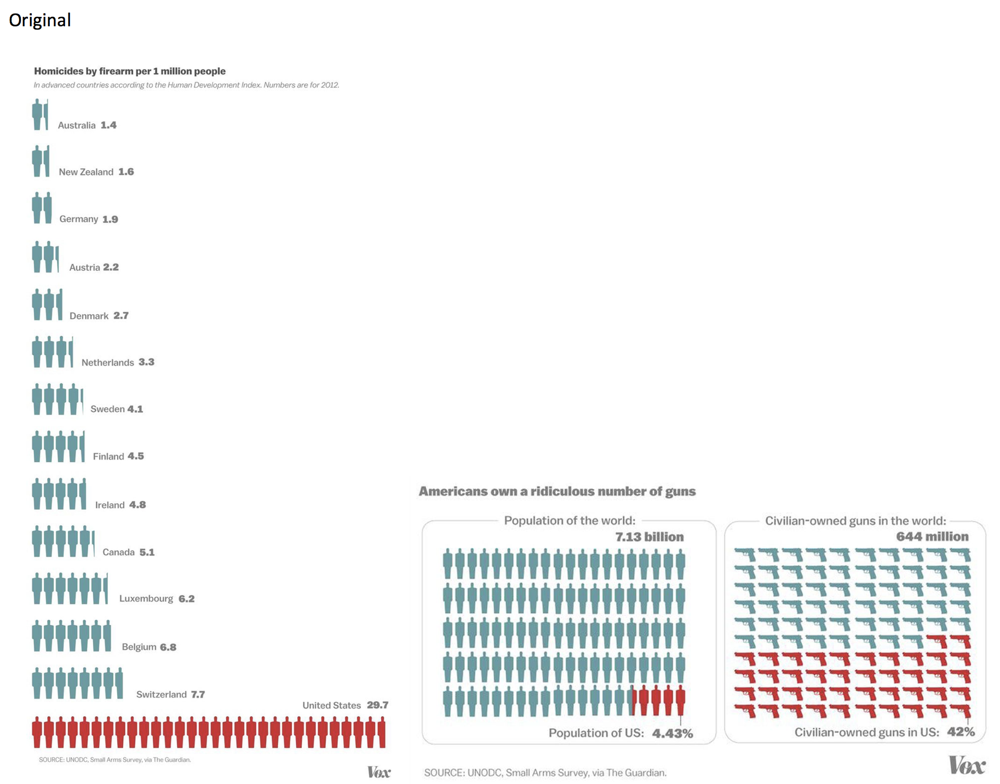

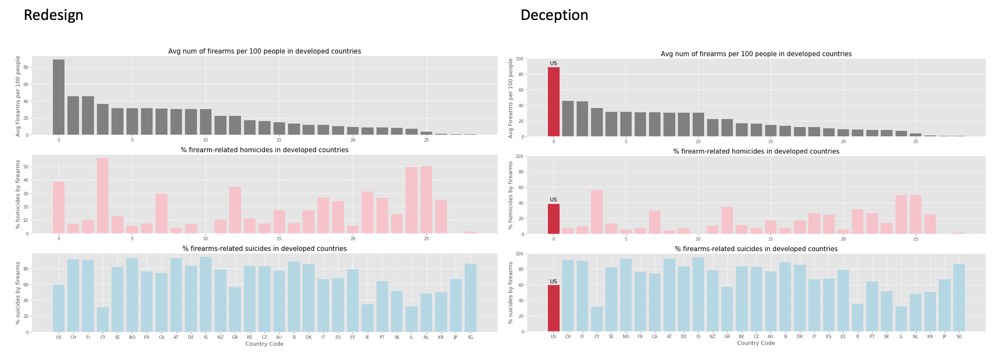

In [14]:
from IPython.display import Image
Image("original_one.png", width=600)
Image("comparison_one.png")

## II. Analysis on Mass Shootings in the US
** Brief Intro:** In this part I want to analyze how the number of mass shooting events change through the timeline, and how the famous shooting events affect the change. Then I can reach a conclusion of whether there's an increase in shooting events as time goes, and if Sandy Hook can be a trigger for the increase. Based on the results one can come up with suggestions for future regulations/ preventions.

### Goal, Questions, Metrics
**Goal:** The goal of this part is to reach a conclusion showing the number of mass shootings in the US has increased through the years, and the world famous mass shooting tragedy "Sandy Hook" can be a turning point for this large increase.  
**Questions:** The questions are:  
1) Is there an increase on the number of mass shootings happened in the US since 1966?  
2) Is there any huge increase after Sandy Hook happened?   
**Metrics:** In order to answer the questions, I would develop a chart on number of attacks per year from 1966-2017 and then analyze the changes to reach the conclusion.

### The Making of & Data Wrangling:
The dataset used in this part contains mass shootings information within US since 1966, which I downloaded from kaggle(link: https://www.kaggle.com/zusmani/us-mass-shootings-last-50-years/data). As a data cleaning process, I converted the dates to datetime data type and extracted the year only as the x-axis. I then used the count of events as the y-axis to plot the chart to analyze the changes.  

Background story of Sandy Hook:  
The Sandy Hook Elementary School shooting occurred on December 14, 2012, in Newtown, Connecticut, United States, when 20-year-old Adam Lanza fatally shot 20 children between six and seven years old, as well as six adult staff members  (link: https://en.wikipedia.org/wiki/Sandy_Hook_Elementary_School_shooting).

**- Data Wrangling:**

In [15]:
# load the dataframe:
ms = pd.read_csv('https://raw.githubusercontent.com/allisonyanc/IP_viz/IP_FV_Deceptive/Mass%20Shootings%20Dataset.csv')

In [16]:
# convert Date to datetime
ms['Date'] = pd.to_datetime(ms['Date'])
ms['Date'] = ms['Date'].dt.date

### Redesign
**- The Reasonings:**  
In this part I redesigned the following plot in the original data product:

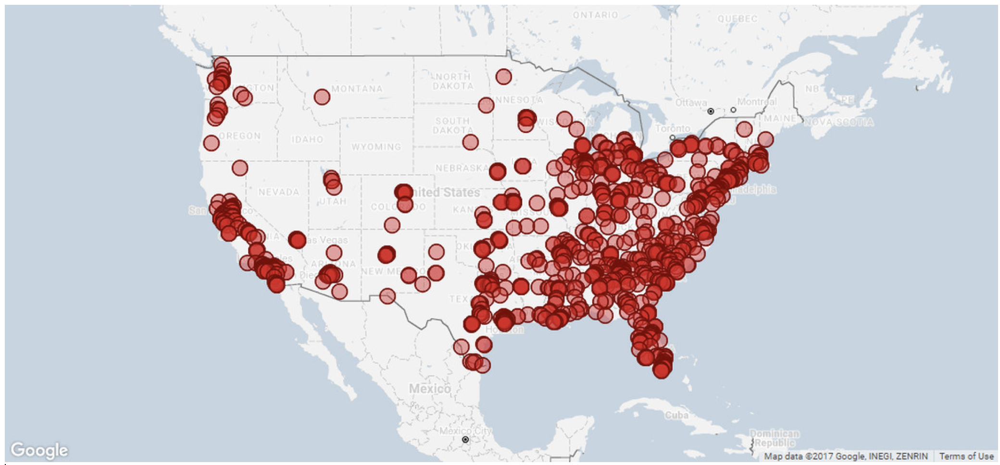

In [17]:
# "3) There have been more than 1,600 mass shootings since Sandy Hook"
Image("redesign_two.png", width=700)

The reason why I want to redesign this plot is:  
- First, this plot doesn't have a title or any explanatory information on it. The only information we can get is it's a map of the United States, and there's high density dots in the east coast and west coast. What's the meaning of the chart and what's the goal of this chart? We don't know.
- Second, after reading the wording parts followed by this chart, I learned this is a chart showing that there have been more than 1600 mass shootings since Sandy Hook. But again, even this chart has a title, it still didn't reveal the wording information well.
- Third, if we want to show the increase after a certain time point, I think having a chart following the timeline will have a better visualization to show the changes than doing it in a geographical way. And not only focusing on the "after" but also showing the "before" is also necessary when trying to show the difference.

**- My redesign steps and interpretations:**  

### Finding 2:
**Number of mass shootings happened in the US 1966-2017**

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41]),
 <a list of 42 Text xticklabel objects>)

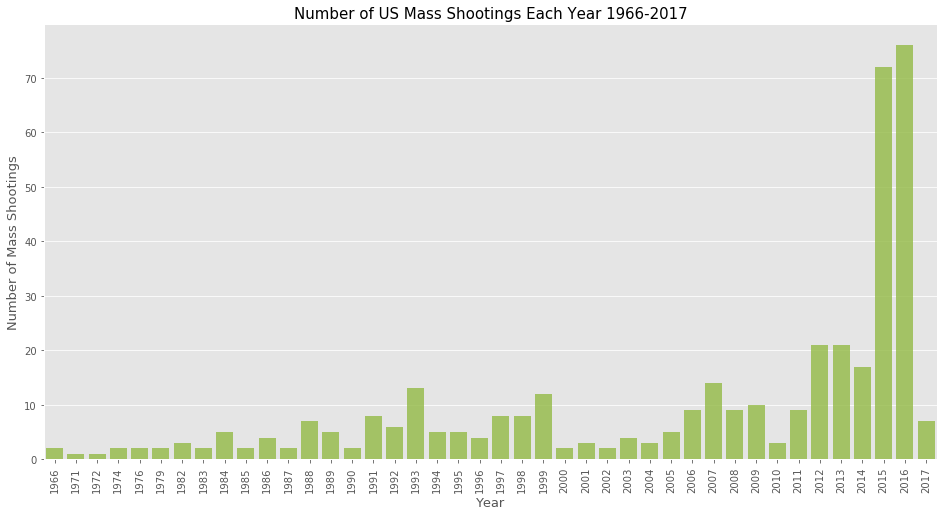

In [18]:
import datetime
ms['Date'] = pd.to_datetime(ms['Date'])
ms['Year'] = ms['Date'].dt.year
cnt_srs = ms['Year'].value_counts()
plt.figure(figsize=(16,8))
sns.barplot(cnt_srs.index, cnt_srs.values, alpha=0.8, color='yellowgreen')
plt.xticks(rotation='vertical')
plt.xlabel('Year', fontsize=13)
plt.ylabel('Number of Mass Shootings', fontsize=13)
plt.title('Number of US Mass Shootings Each Year 1966-2017', fontsize=15)
plt.show()

In December 2012, the world known shooting tragedy ‘Sandy Hook’ happened in Newtown,
Connecticut. Since this mass shooting happened, many people would then concern that will this
be some trigger leading more mass shootings in the US? One can clearly see from the chart that
since 2012/2013 there was a huge increase in the number of mass shootings in the US. This huge
increase in number doesn’t directly reveal any impact of Sandy Hook, but it could still be one of
the major reasons driving the changes.

**- Argument Model:**  
**My claim**: The number of mass shootings has increased a lot since the Sandy Hook tragedy happened. **Is based on data**: mass shooting informations within US since 1966. **Since warrant**: based on the chart it shows the number of mass shootings has been steadily increasing since 1966, and there's huge increase in 2015 and 2016 after the Sandy Hook attack in the end of 2012. **On account of backing**: As mentioned in the study "Firearms and accidental deaths: Evidence from the aftermath of the Sandy Hook school shooting" by Phillip B. Levine1 and Robin McKnight (link: http://science.sciencemag.org/content/358/6368/1324), as a consequence of Sandy Hook, the increase in gun purchases (as recorded by an increased number of background checks) shows that the increased exposure to guns resulted in ∼60 accidental deaths. **Rebuttal**: From the chart we can tell there's no immediate increase right after 2012, which means Sandy Hook might not be the direct reason for it. But it is also reasonable to have buffer time before the spike and it is still true that this huge increase is happened within 3 years after the tragedy happened.   
This also match with the **audience model**'s want, need and fear.

### Deception
The deceptive version is based on my redesigned version instead of the original data product.  
  
**- The Reasonings:**  
From the redesigned version one can tell there's steady increase along the time, but the plot shrinked and deleted the years with zero shootings, which I think we should still keep it in the chart. Those years with zero shooting can make the first half of the plot being more towards zero and to enlarge the "less attacks in the previous years" comparing with the recent years' increase. Also since we want to highlight Sandy Hook, it is helpful to highlight the bar with red color to make it more standout and then to be used as the point of change.

([<matplotlib.axis.XTick at 0x10efcd190>,
 <a list of 42 Text xticklabel objects>)

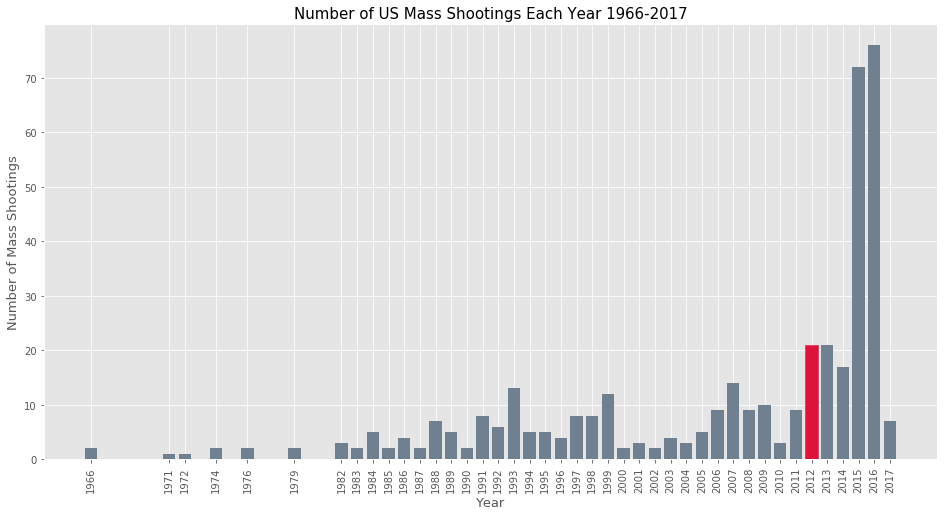

In [19]:
# number of mass shootings by year
import datetime
ms['Date'] = pd.to_datetime(ms['Date'])
ms['Year'] = ms['Date'].dt.year
cnt_srs = ms['Year'].value_counts()
fig = plt.figure(figsize=(16,8))
barlist = plt.bar(cnt_srs.index, cnt_srs.values, color='slategrey')
plt.xticks(cnt_srs.index, rotation='vertical')
plt.xlabel('Year', fontsize=13)
plt.ylabel('Number of Mass Shootings', fontsize=13)
plt.title('Number of US Mass Shootings Each Year 1966-2017', fontsize=15)

barlist[3].set_color('crimson')
plt.show()

**- Data Pixel Ratio**:  
Because we want to show the year 2012 as a change point, it is necessary to add the bright red color in the plot. Eye beats memory: the x-axis follows timeline and the bar height represents the amount, it's easy and straightforward for the audiences to read and catch information. Also all the pixels used in this chart are useful and has its own meaning when interpreting the results.

### Original version vs. Redesigned version vs. Deceptive version

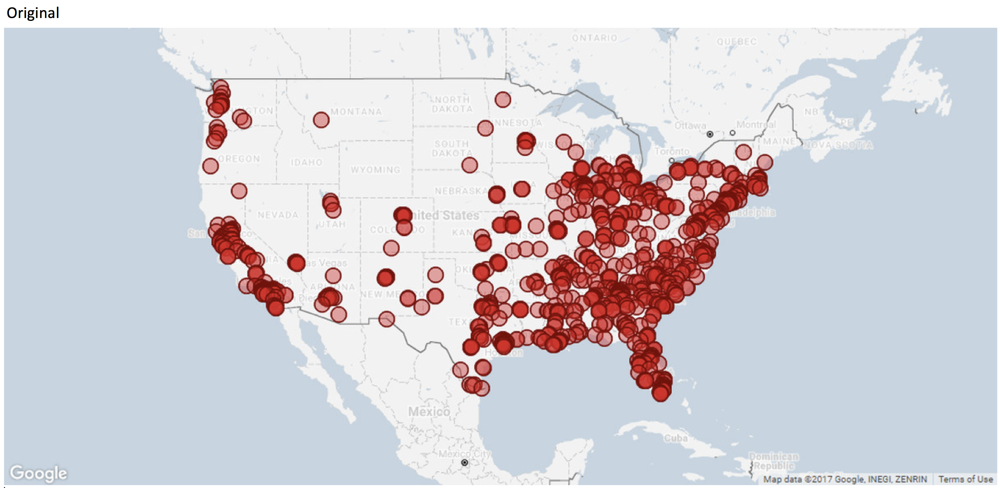

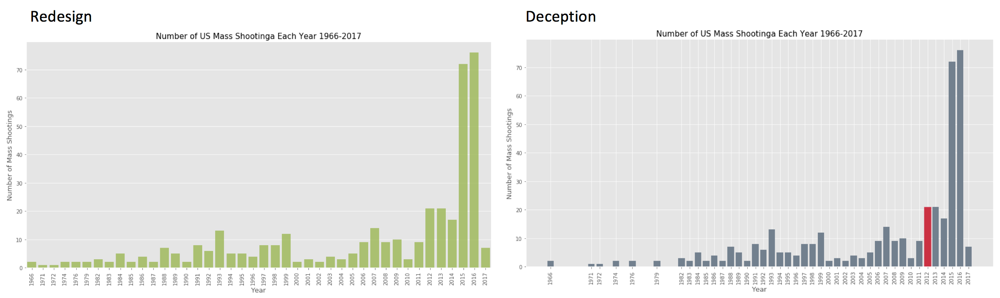

In [20]:
from IPython.display import Image
Image("original_two.png", width=500)
Image("compare_two.png")

## III. Analysis on Firearms Regulations Acceptance In the US
** Brief Intro:** In this part I want to analyze how the historical firearms regulations acceptance change since 1991 and then investigate more into how the acceptance rate change per categories. By reading the charts I can then reach to a conclusion of whether there's enough work on implementing regulations historically, which category has more supports, and which categories need special attentions. 

### Goal, Questions, Metrics
**Goal:** The goal of this part is to show from the charts that there's no significant increase in firearms regulation acceptance along the years. When investigating more into detailed regulation categories, there's still not much differences or there's even having negative movements. This will then reach to a conclusion that US needs to increase the strength on firearm regulations, and it is very important to come up with certain solutions targeting different categories to achieve in increasing the acceptance rate, for example, limitation on gun manufactoring.  
**Questions:** The questions are:  
1) Does the national firearm regulation acceptance rate change through the years?  
2) Does the the firearm regulation acceptance rate per category change through the years?   
**Metrics:** In order to answer the questions and then reach the goal, I developed two different plots on firearm regulation acceptance rate, and firearm regulation acceptance rate per category to explore the changes.

### The Making of & Data Wrangling: 
- The dataset contains information about the Federal regulations of firearms from 1991 to 2017, for all 50 U.S. states, which also includes files that separate gun violence incidents by category, including deaths and injuries of children and teens, and a collection of mass shootings. I downloaded them from kaggle(link: https://www.kaggle.com/jonathanbouchet/firearm-regulations-in-the-u-s/data).  
- As a data preparation process, I first calculated the percentage of the state as the sum divided by the total number of provisions, and then plot the geom_density_ridges_gradient chart showing national regulation acceptance rate in each year.  
- Then based on the 14 category groups from the codebook.xls file, I created provision vectors for each category and then subset the dataframe for each category, sum the components of each category and calculate the respective percentage. Then I plot the geom_density_ridges_gradient chart showing national regulation acceptance rate in each year per categories. 

**- Data Wrangling:**  
* I did the whole Part III in R, here is the link of the R file:(https://github.com/allisonyanc/IP_viz/blob/IP_RV/IP_Revision_GunControl_YanCao.Rmd), and I'll also copy my codes in the markdown cells here and attach the result charts as images in Python notebook.

R Codes:

#load packages: 
library(ggplot2)  
library(dplyr)  
library(gridExtra)  
library(ggthemes)  
library(RColorBrewer)  
library(viridis)  
library(openxlsx)  
library(choroplethr)  
library(ggridges)  
library(knitr)  
library(ggrepel)  
library(fmsb)

#load dataset:  
setwd("/Users/yancao/Desktop/SCU/Spring 2018/Visualization/Individual Project/IP_FV_redesign")    
raw_data< read.csv('https://raw.githubusercontent.com/allisonyanc/IP_viz/IP_FV_Deceptive/gun_regulation_raw_data.csv',sep=',',stringsAsFactors=F)  
codes <- read.xlsx("codebook.xlsx")

#make provisions vector for each category:  
listCodes<-list()  
for(i in 1:length(unique(codes$Category.Code))){
    listCodes[[i]]<-codes %>% dplyr::filter(Category.Code==i) %>% dplyr::select(Variable.Name) %>% sapply(as.character) %>% as.vector()
} 

#subset the dataset for each component and sum components of each categories:  
namesCat<-c('dealer_regulation','buyer_regulation','prohibition_high_risk','background_check','ammo_regulation','possession_regulation','concealed_carry','assault_weapon_mag','child_access_prev','gun_trafficking','stand_your_ground','preemption','immunity','domestic_violence')  
tempo<-list()  
baseDf<-raw_data[ ,c('year','state')]  
for(i in 1:length(namesCat)){
    temp<-data.frame(raw_data[ ,c(listCodes[[i]])])
    totCols<-length(colnames(temp))
    tempDf<-temp %>% dplyr::mutate(sum = rowSums(.), perc = round(100*(sum/totCols),2)) %>% dplyr::select(sum,perc)
    tempDf$Cat<-rep(namesCat[i],1,nrow(tempDf))
    tempo[[i]]<-cbind(baseDf,tempDf)
}  

#make a dataframe from all lists:  
RES <- do.call("rbind", tempo)

### Redesign
**- The Reasonings:**  
In this part I redesigned the following plot in the original data product:

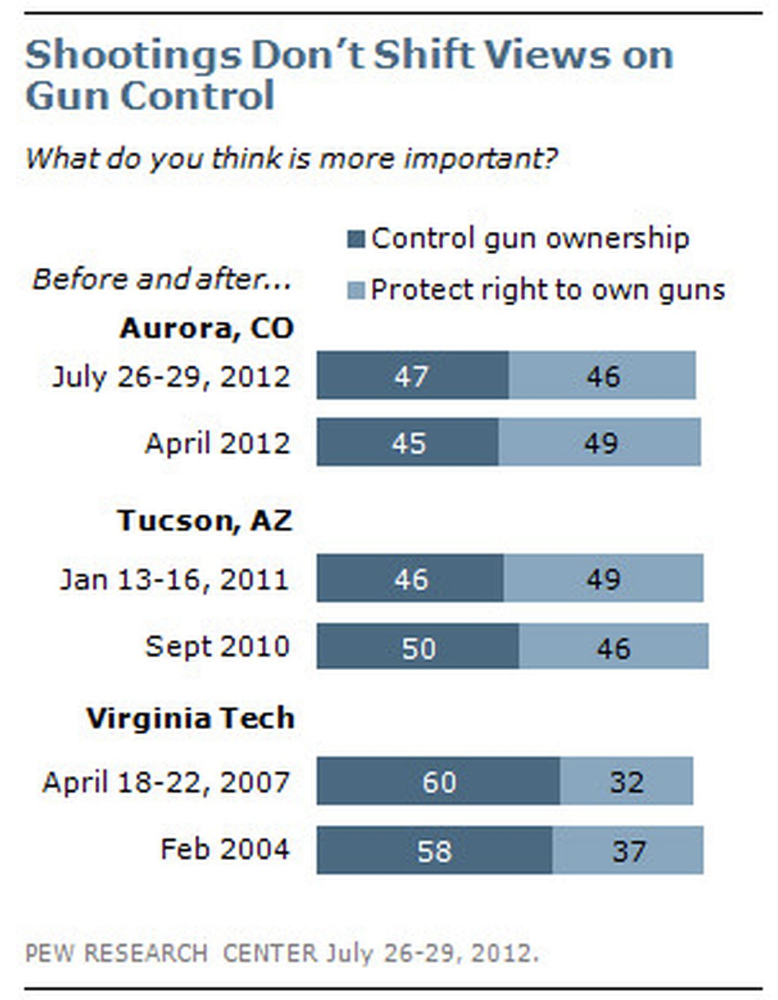

In [21]:
# "16) High-profile shootings don’t appear to lead to more support for gun control in the long term" 
from IPython.display import Image
Image("redesign_three.png", width=500)

The reason why I want to redesign this plot is because:  
- First the plot context itself doesn't make sense. It used three different states and compared the views on gun control in different years for each state, but what's the point of this comparison? I don't quite get the information. What does those years mean, or is there any mass shootings happened in between those years? The chart didn't include any background information. Also why choosing those three states? It didn't explain it either. So overall this chart is confusing.
- I think since we don't have a reference point, it would make more sense by ploting the national comparison through years first to see the changes, and then investigate into the categories. Also having regulation acceptance rates can be a stronger evidence backing the facts than having residences' views.

**- My redesign steps and interpretations:**  

**US historical firearms regulations acceptance across all states by years**

R Codes:  

#plot US historical firearms regulations acceptance rate by years  
raw_data %>% dplyr::select(state,year,lawtotal) %>%   
  mutate(state = factor(state),  
         state = factor(state, levels = rev(levels(state))),  
         perc = 100*(lawtotal/133)) %>%  
  ggplot(aes(x=perc,y=factor(year), fill = ..x..)) +  
  geom_density_ridges_gradient(scale = 3,gradient_lwd = 1.,alpha=.1) +  
  scale_fill_viridis(option="plasma", name='percentage',limits=c(0,100)) +  
  theme_fivethirtyeight() +  
  labs(x = 'year', y = '% of acceptance', title = 'US historical firearms regulations acceptance by years') +  
  theme(legend.position='right', legend.direction='vertical',axis.title.y = element_blank(),  
        axis.title.x = element_blank()) + xlim(0,100) 

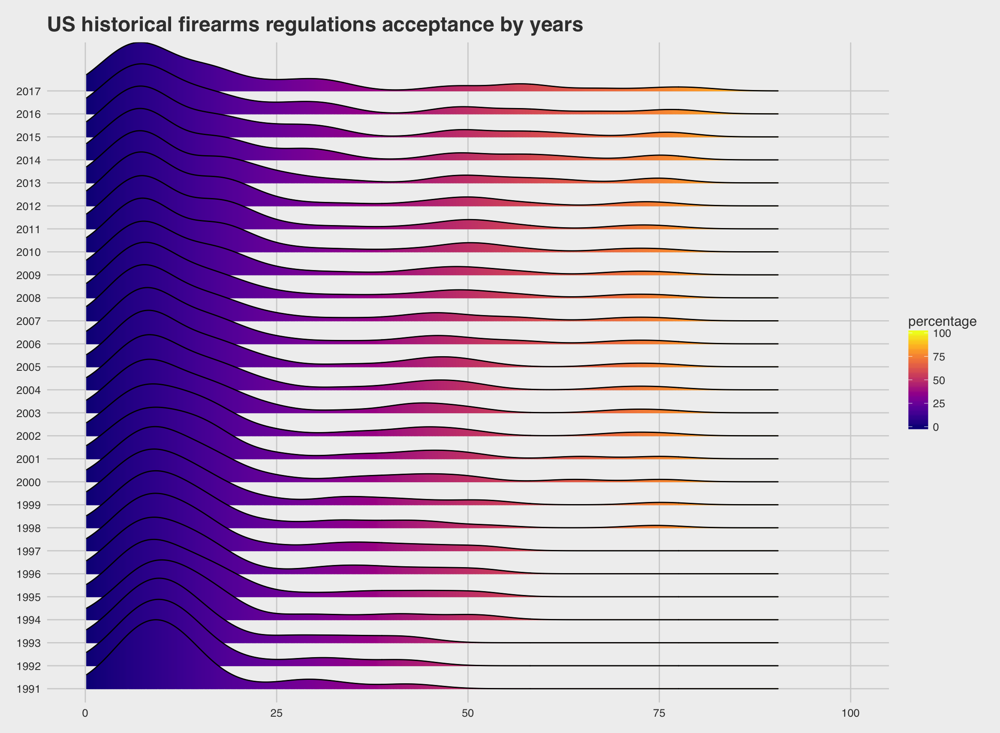

In [22]:
Image("national_1.png", width=800)

This chart shows the percentage normalized to the total number of regulations in effect within the US. From the chart it shows the US firearms regulations is still not effective comparing to the historical records. For example, in 2017, there are only less than 15% of all states in the US are above 50% acceptance, where there’s only slightly increase but not much difference comparing to the year of 1991.

### Finding 3:

**Historical Firearms regulations acceptance per category**

R Codes:  
#plot historical firearms regulations acceptance per category by years  
RES %>%  
  dplyr::group_by(Cat,year) %>%  
  dplyr::summarize(meanCat = mean(perc)) %>%  
  ggplot(aes(x=factor(year),y=meanCat,group=Cat)) +  
  geom_line(aes(color=meanCat),size=1.5) +  
  scale_color_gradientn(name="",colors=rev(viridis::viridis(10)),limits=c(0,100)) +  
  theme_fivethirtyeight() +  
  theme(axis.text.x = element_text(size=6,angle=45),  
        axis.text.y = element_text(size=6)) +  
  ylim(0,100) + facet_wrap(~Cat,ncol=2) +  
  labs(title="firearms regulations acceptance per category")

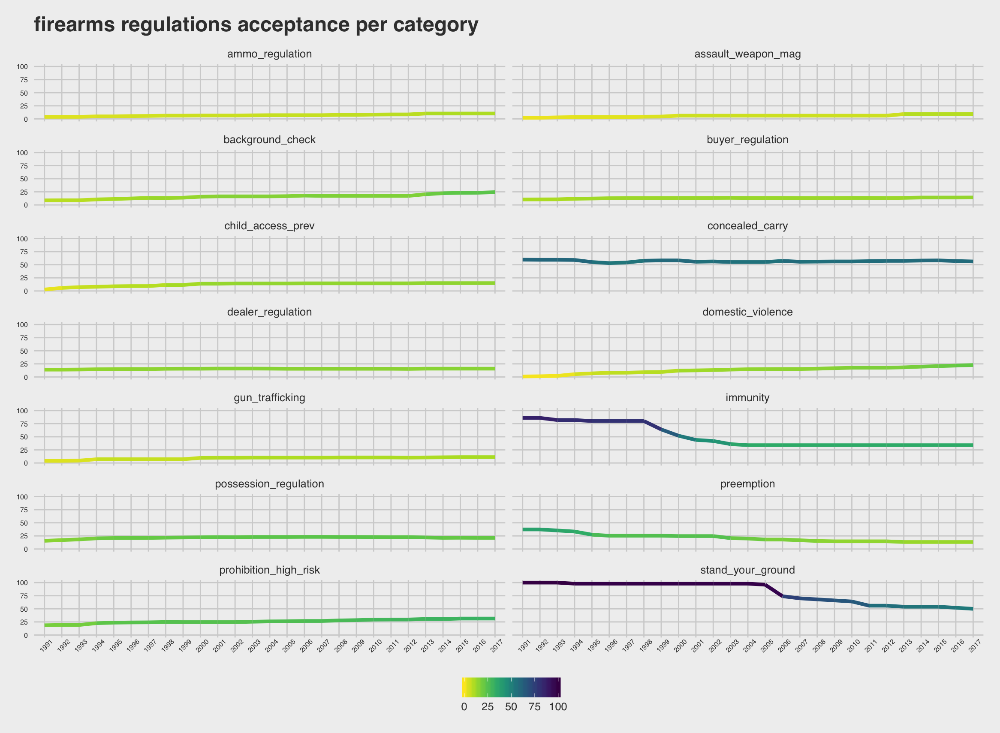

In [23]:
Image("category_1.png", width=800)

To investigate more into different categories of firearm regulations, we can tell there's small increase in background check and domestic violence provisions acceptance over the years. But stand your ground law has been decreased since 2005, meaning free to use deadly force as first redort in public has been increasingly accepted. Also immunity has been slowly decreasing over the years, which means there's decreasing protection to guns manufacturers for damages caused by their products. Even though we have some slowly increasing acceptance rate, but the majorities are still steadily moving and also with some big decrease, which reveals a bad regulation acceptance results. This then reveals US needs to put more efforts on gun controls with multiple focus on different categories.


**- Argument Model:**  
**My claim**: US is lacking gun control and needs to increase the strength on firearm regulations targeting different categories. **Is based on data**: federal regulations of firearms from 1991 to 2017, for all 50 U.S. states. **Since warrant**: based on the chart it shows the firearm regulation acceptance rates across all states didn't change much through the years. For each categories there's only a little increase on certain category, where the majorities are still keep steady while some categories having big drops. **On account of backing**: Based on the existing analysis, America’s poor enforcement of its gun laws keeps contributing to mass shootings (source: https://www.vox.com/policy-and-politics/2017/11/7/16617488/air-force-sutherland-springs-texas-church-shooting). **Rebuttal**: Gun control is always a debating topic, and it is always hard to implement it since there are so many unforeseeable barriers. And also there's always controversial topics like "Is There a Meaningful Legislative Solution for Mass Shootings?" (link: https://www.theatlantic.com/politics/archive/2017/10/mass-shootings/542535/) debating the necessity of gun controls.  
This also match with the **audience model**'s want, need and fear.

### Deception
The deceptive version is based on my redesigned version instead of the original data product.  
  
**- The Reasonings:**  
From the redesign version one can read the movements among the years, but it would be more effective if we can target a special period of time and to see how things changed during that time and in the specific targeted place. In this case, since I've been analyzing Sandy Hook in the previous data products, I would create my deceptive version of this part by subsetting the data into only years 2007 - 2017 (5 years ahead and 5 years after 2012, 10 years in total), and also I would subcategorize the states to Connecticut (where Sandy Hook happened) to make the chart. This would show more variety in movements than the redesign one.

**R Codes**:
#plot the deceptive version of the historical firearms regulations acceptance per category by years chart  
raw_data1 = raw_data[ which(raw_data$year >= '2007'),]  

namesCat<-c('dealer_regulation','buyer_regulation','prohibition_high_risk','background_check','ammo_regulation','possession_regulation','concealed_carry','assault_weapon_mag','child_access_prev','gun_trafficking','stand_your_ground','preemption','immunity','domestic_violence')  

tempo<-list()  
baseDf<-raw_data1[ ,c('year','state')]  
for(i in 1:length(namesCat)){
    temp<-data.frame(raw_data1[ ,c(listCodes[[i]])])
    totCols<-length(colnames(temp))
    tempDf<-temp %>% dplyr::mutate(sum = rowSums(.), perc = round(100*(sum/totCols),2)) %>% dplyr::select(sum,perc)
    tempDf$Cat<-rep(namesCat[i],1,nrow(tempDf))
    tempo[[i]]<-cbind(baseDf,tempDf)
}  

#make a dataframe from all lists  
RES <- do.call("rbind", tempo)  

plotCategory<-function(x){  
  RES %>%   
  dplyr::filter(state==curState) %>% 
  ggplot(aes(x=factor(year),y=perc,group=Cat)) + 
  geom_line(aes(color=perc),size=1.5) + 
  theme_fivethirtyeight() + 
  theme(axis.text.x = element_text(size=6,angle=45),
        axis.text.y = element_text(size=6)) + 
  scale_color_gradientn(name="percentage ",colors=rev(viridis::viridis(100)),limits=c(0,100)) + 
  ylim(0,100) + facet_wrap(~Cat,ncol=2) + 
  ggtitle(paste0('Historical Firearms regulations acceptance per category in ',curState),
          subtitle = 'percentage normalized to the total number of regulations in each category')
}  

curState<-'Connecticut'  # sandy hooks happened in connecticut  
plotCategory(curState)  

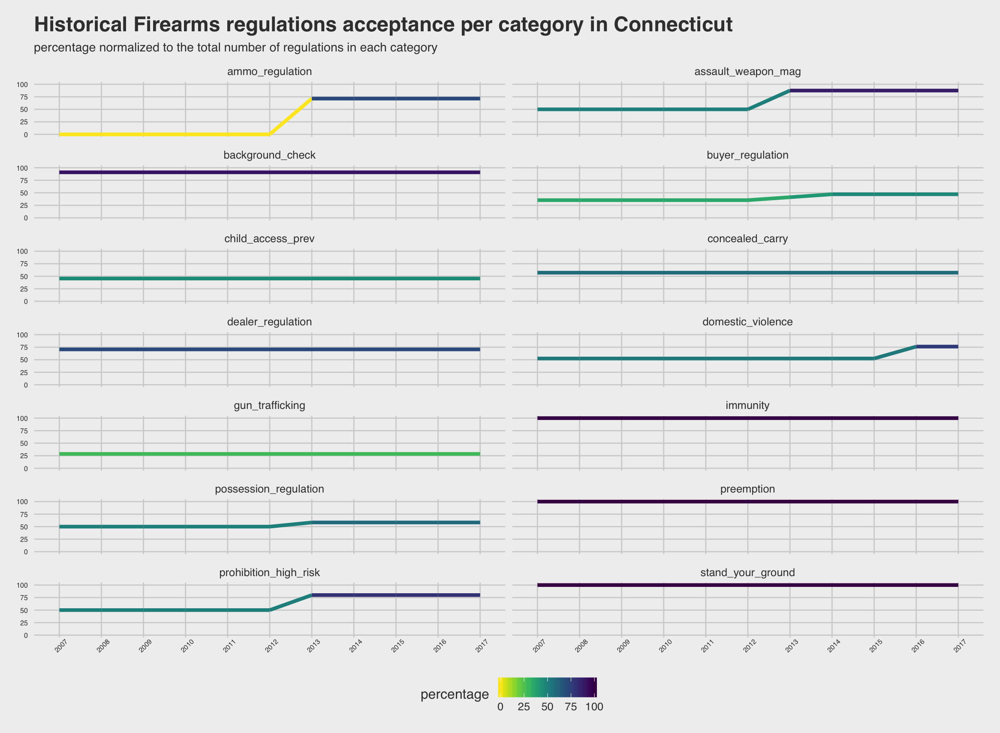

In [24]:
Image("connecticut.png", width=800)

From this deceptive version we can find more reasonable movements based on the existing Sandy Hook mass shooting, and the increase on multiple categories are more significant that the redesign. It also supports that there's definitely an increase on the acceptance rates after mass shooting tradegy happened, which is a good sign to US gun controls.

**- Data Pixel Ratio**:  
Because we want to show the percentage change, it is useful to use the gradient color where bright color like yellow indicates smaller percentage while darker color means larger numbers. Eye beats memory: multiple subplots with same x and y axis, and having its individual lines are easy and straightforward for the audiences to read and catch information. Also all the pixels used in this chart are useful and has its own meaning when interpreting the results.

### Original version vs. Redesigned version vs. Deceptive version

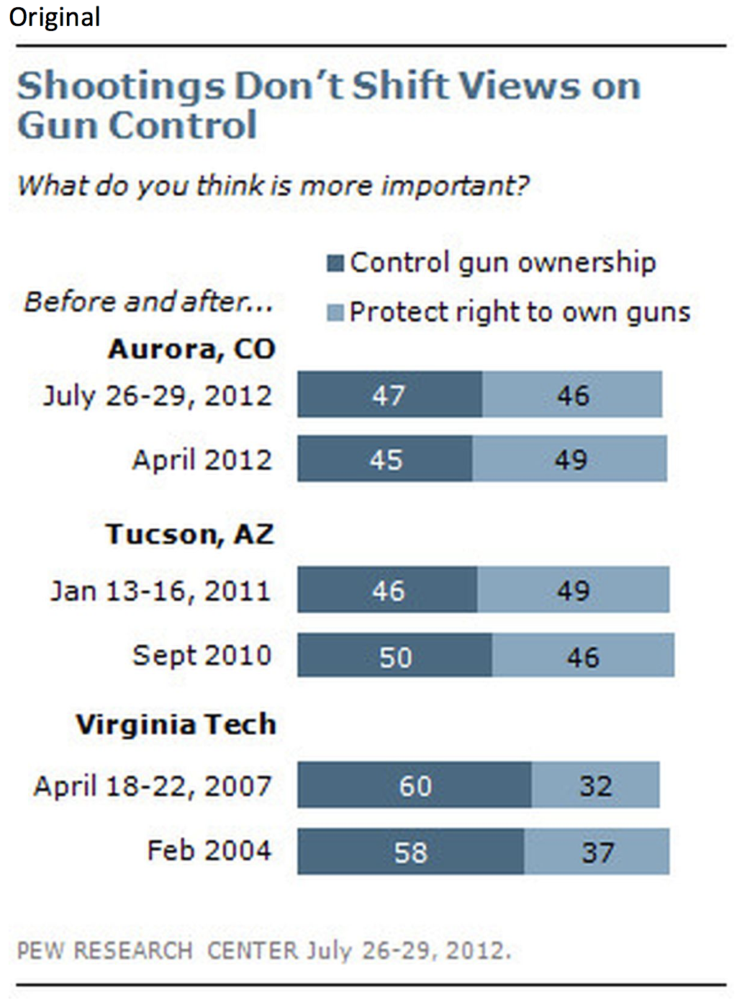

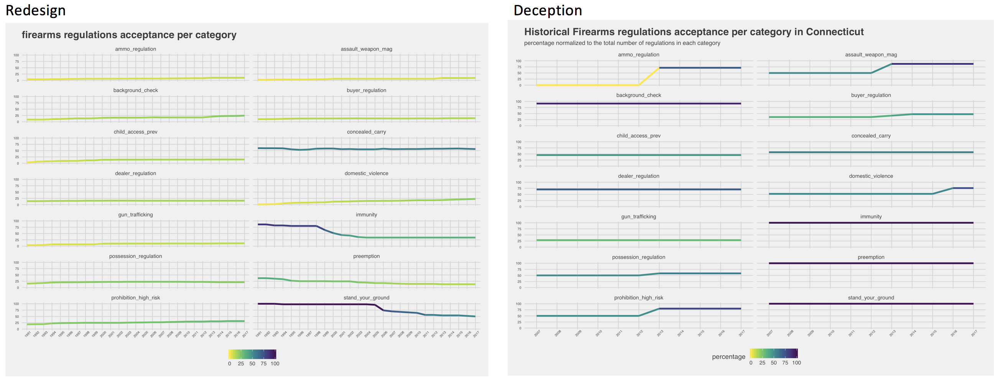

In [25]:
from IPython.display import Image
Image("original_three.png", width=400)
Image("compare_three.png")

## Conclusion

As a conclusion, gun violence in the US is still a severe problem that need the whole society’s attentions. Although the firearm homicide and suicide rates might not be directly driven by gun ownership, the horrible fact of almost one gun per capita in the US should also drive the government’s attention. Social media regulations on how to broadcasting the tragedy to the public to increase the awareness, but at the same time preventing spreading the “satisfaction” of mass shooting to the criminals could be another project that the society needs to keep working on. Then the most
importantly, which at the same time is also the most difficult part, gun control. From the charts we can tell the firearm regulations acceptance rates is not changing much comparing to the increasing mass shooting and firearm-related deaths rates throughout the years. Although it is true that the citizens have right to keep them safe on a personal level, which makes gun control less practical, it is then even more important to implement gun knowledge and implement regulations on gun sales to prevent tragedies happening from the source.